In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session


In [2]:
import pandas as pd
df = pd.read_csv('./WELFake_Dataset.csv')
df.head()


,Unnamed: 0,title,text,label
0,0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1
1,1,NaN,Did they post their votes for Hillary already?,1
2,2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1
3,3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0
4,4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1


In [3]:
df = df.drop('Unnamed: 0', axis = 1)
df.dropna(inplace = True)


# pre-processing

In [4]:
#removing other than alphates and digits
import re
df['title'] = df['title'].str.replace(r"[^\w\s]", "").str.replace(r"\d", "")
df['text'] = df['text'].str.replace(r"[^\w\s]","").str.replace(r"\d", "")
df.head()


,title,text,label
0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1
2,UNBELIEVABLE! OBAMA’S ATTORNEY GENERAL SAYS MO...,"Now, most of the demonstrators gathered last ...",1
3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0
4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1
5,About Time! Christian Group Sues Amazon and SP...,All we can say on this one is it s about time ...,1


In [5]:

import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize


nltk.download('stopwords')
nltk.download('punkt')

# Function to tokenize and remove stopwords from text
def tokenize_and_remove_stopwords(text):
    # Convert the text to lowercase to ensure consistency
    text = text.lower()

    # Get the set of English stopwords from NLTK
    stop_words = set(stopwords.words('english'))

    # Tokenize the text into words
    tokens = word_tokenize(text)

    # Remove stopwords from the list of tokens
    filtered_tokens = [word for word in tokens if word not in stop_words]

    # Reconstruct the text by joining the remaining tokens
    filtered_text = " ".join(filtered_tokens)

    return filtered_text





[nltk_data] Downloading package stopwords to
[nltk_data]     /home/nhatanh/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/nhatanh/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [6]:
# Apply the function to the 'text_column' and create a new column 'filtered_text_column'
df['title'] = df['title'].apply(tokenize_and_remove_stopwords)
df['text'] = df['text'].apply(tokenize_and_remove_stopwords)
df.head()


,title,text,label
0,law enforcement high alert following threats c...,comment expected barack obama members # fyf911...,1
2,unbelievable ! obama ’ attorney general says c...,", demonstrators gathered last night exercising...",1
3,"bobby jindal , raised hindu , uses story chris...",dozen politically active pastors came private ...,0
4,satan 2 : russia unvelis image terrifying new ...,"rs-28 sarmat missile , dubbed satan 2 , replac...",1
5,time ! christian group sues amazon splc design...,say one time someone sued southern poverty law...,1


In [7]:
import numpy as np
X = df['title'] + df['text']
y = df['label']


In [8]:
df.head()


,title,text,label
0,law enforcement high alert following threats c...,comment expected barack obama members # fyf911...,1
2,unbelievable ! obama ’ attorney general says c...,", demonstrators gathered last night exercising...",1
3,"bobby jindal , raised hindu , uses story chris...",dozen politically active pastors came private ...,0
4,satan 2 : russia unvelis image terrifying new ...,"rs-28 sarmat missile , dubbed satan 2 , replac...",1
5,time ! christian group sues amazon splc design...,say one time someone sued southern poverty law...,1


In [9]:
print(X)


0        law enforcement high alert following threats c...
2        unbelievable ! obama ’ attorney general says c...
3        bobby jindal , raised hindu , uses story chris...
4        satan 2 : russia unvelis image terrifying new ...
5        time ! christian group sues amazon splc design...
                               ...                        
72129    russians steal research trump hack u.s. democr...
72130    watch : giuliani demands democrats apologize t...
72131    migrants refuse leave train refugee camp hunga...
72132    trump tussle gives unpopular mexican leader mu...
72133    goldman sachs endorses hillary clinton preside...
Length: 71537, dtype: object


In [10]:
print(y)


0        1
2        1
3        0
4        1
5        1
        ..
72129    0
72130    1
72131    0
72132    0
72133    1
Name: label, Length: 71537, dtype: int64


In [11]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y , test_size = 0.15, random_state = 42)


In [12]:
max_words = 10000 # total number of words in the dictionary
max_len = 1000 # length of each sentence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence

tokenizer= Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(X_train)

# Step 2: Get the total number of words in the vocabulary
total_words = len(tokenizer.word_index)

# Step 3: Get the occurrences of each word
word_counts = tokenizer.word_counts


2025-11-29 20:15:59.397734: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-29 20:15:59.569641: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764422159.636497  357392 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764422159.655581  357392 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1764422159.782228  357392 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [13]:
print(X_train.info())


<class 'pandas.core.series.Series'>
Index: 60806 entries, 31206 to 15897
Series name: None
Non-Null Count  Dtype 
--------------  ----- 
60806 non-null  object
dtypes: object(1)
memory usage: 950.1+ KB
None


In [14]:

training_sequences = tokenizer.texts_to_sequences(X_train)
training_padded = sequence.pad_sequences(training_sequences,maxlen=max_len)

test_sequences = tokenizer.texts_to_sequences(X_test)
testing_padded = sequence.pad_sequences(test_sequences,maxlen=max_len)


In [15]:
# creating the dictionary having words as keys and corr vector as values of words which are in glove
embeddings_index = dict()
f = open('glove.6B.100d.txt', encoding = "utf8")
for line in f:
    values = line.split() #breaking each line into word and number (each line has first word then numbers representing that vector)
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
print (len(embeddings_index))
f.close()


400000


In [16]:
embedding_matrix = np.zeros((max_words, 100))
for word, index in tokenizer.word_index.items():
    if index > max_words - 1:
        break
    else:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[index] = embedding_vector
print (embedding_matrix)


[[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [-0.026284    0.017938   -0.50164998 ... -0.86879998  0.94094002
  -0.28815001]
 [-0.042568   -0.084246   -0.33094999 ... -0.92315     0.012559
   0.21473999]
 ...
 [-0.30752999  0.28876001  0.64822    ... -0.47023001  0.39616001
   0.56001002]
 [ 0.14132001 -0.54245001 -0.92558998 ...  1.5359      0.25397
  -0.75093001]
 [-0.014626    0.16706    -0.24719    ...  0.055947   -0.24697
   0.1191    ]]


In [17]:
print(type(y_train))


<class 'pandas.core.series.Series'>


In [18]:
y_train = y_train.values
y_test = y_test.values


In [19]:
print(training_padded.shape)
print(y_train.shape)
print(testing_padded.shape)
print(y_test.shape)


(60806, 1000)
(60806,)
(10731, 1000)
(10731,)


In [20]:
# from tensorflow import keras
# from tensorflow.keras import layers

# CONSISTENT IMPORTS
import tf_keras as keras
from tf_keras import layers

num_classes = 1  # Replace this with the actual number of classes in your dataset

# Define the custom embedding layer using the embedding_matrix
embedding_layer = layers.Embedding(
    max_words,
    100,
    weights=[embedding_matrix],  # Pass the embedding_matrix as the weights
    input_length=max_len,
    trainable=False  # Set trainable to False to keep the pre-trained embeddings fixed
)

model_3 = keras.Sequential([
    embedding_layer,  # Use the custom embedding layer here
    layers.Conv1D(filters=32, kernel_size=3, activation='relu'),
    layers.BatchNormalization(),
    layers.Conv1D(filters=32, kernel_size=3, activation='relu'),
    layers.MaxPooling1D(pool_size=2, strides=2, padding='valid'),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='sigmoid')  # Output layer with the correct number of classes
])



I0000 00:00:1764422204.168311  357392 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9571 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:01:00.0, compute capability: 8.6


In [21]:
# Compile the model with an appropriate loss function and optimizer
model_3.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
model_3.summary()

hist = model_3.fit(training_padded, y_train, validation_data=(testing_padded, y_test), batch_size=20, epochs=20, verbose=2)
accr = model_3.evaluate(testing_padded, y_test, verbose=0)
print('Test Accuracy', accr[1])


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 100)         1000000   
                                                                 
 conv1d (Conv1D)             (None, 998, 32)           9632      
                                                                 
 batch_normalization (Batch  (None, 998, 32)           128       


 Normalization)                                                  
                                                                 
 conv1d_1 (Conv1D)           (None, 996, 32)           3104      
                                                                 
 max_pooling1d (MaxPooling1  (None, 498, 32)           0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 15936)             0         
                                                                 
 dense (Dense)               (None, 128)               2039936   
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 3052929 (11.65 MB)
Trainable params: 2052865 (7.83 MB)
Non-trainable params: 1000064 (3.81 MB)
_________________________________

I0000 00:00:1764422206.227623  358062 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1764422207.576805  358061 service.cc:152] XLA service 0x7f9d6505eef0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1764422207.576876  358061 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 3080, Compute Capability 8.6
2025-11-29 20:16:47.598232: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1764422207.815811  358061 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


3041/3041 - 28s - loss: 0.2263 - accuracy: 0.9120 - val_loss: 0.1128 - val_accuracy: 0.9584 - 28s/epoch - 9ms/step
Epoch 2/20
3041/3041 - 24s - loss: 0.0954 - accuracy: 0.9657 - val_loss: 0.0900 - val_accuracy: 0.9665 - 24s/epoch - 8ms/step
Epoch 3/20
3041/3041 - 28s - loss: 0.0607 - accuracy: 0.9776 - val_loss: 0.0898 - val_accuracy: 0.9692 - 28s/epoch - 9ms/step
Epoch 4/20
3041/3041 - 23s - loss: 0.0403 - accuracy: 0.9856 - val_loss: 0.0942 - val_accuracy: 0.9711 - 23s/epoch - 8ms/step
Epoch 5/20
3041/3041 - 23s - loss: 0.0281 - accuracy: 0.9902 - val_loss: 0.1004 - val_accuracy: 0.9718 - 23s/epoch - 8ms/step
Epoch 6/20
3041/3041 - 24s - loss: 0.0217 - accuracy: 0.9925 - val_loss: 0.1243 - val_accuracy: 0.9693 - 24s/epoch - 8ms/step
Epoch 7/20
3041/3041 - 23s - loss: 0.0190 - accuracy: 0.9937 - val_loss: 0.1365 - val_accuracy: 0.9704 - 23s/epoch - 8ms/step
Epoch 8/20
3041/3041 - 23s - loss: 0.0148 - accuracy: 0.9951 - val_loss: 0.2913 - val_accuracy: 0.9475 - 23s/epoch - 8ms/step
Epo

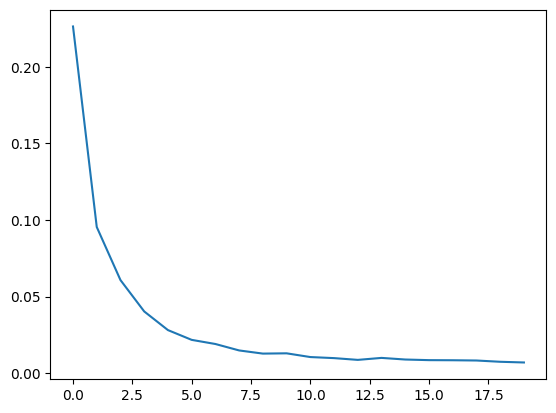

In [22]:
import pandas as pd

history_df = pd.DataFrame(hist.history)
history_df['loss'].plot();


In [23]:
!pip install shap


In [24]:
import shap
shap.initjs()


/home/nhatanh/miniconda3/envs/tf-gpu/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [29]:
import numpy as np
import shap
from tensorflow.keras.preprocessing.sequence import pad_sequences

# 1. Initialize JS
shap.initjs()

# 2. Define the Wrapper
def predict_shap(texts):
    # Convert numpy array to list
    text_list = texts.tolist()

    # Tokenize
    sequences = tokenizer.texts_to_sequences(text_list)

    # --- FIX IS HERE: Changed maxlen from 100 to 1000 ---
    padded_sequences = pad_sequences(
        sequences,
        maxlen=1000,     # MUST match the input_length of your model
        padding='post',  # Ensure this matches your training logic
        truncating='post'
    )

    preds = model_3.predict(padded_sequences, verbose=0)

    if preds.shape[1] == 2:
        return preds[:, 1]
    else:
        return preds.reshape(-1)

# 3. Sample Data
# CRITICAL: 'sample_texts' must be RAW STRINGS (e.g., "The movie was great")
# If X_test contains numbers, use df['text'] or your original string list instead.
sample_texts = X_test[:200]

# 4. Initialize Explainer
# (using default masker because Keras tokenizer isn't directly compatible)
explainer = shap.Explainer(
    predict_shap,
    masker=shap.maskers.Text()
)

# 5. Compute and Visualize
shap_values = explainer(sample_texts)
shap.plots.text(shap_values[0])


PartitionExplainer explainer: 201it [17:22,  5.24s/it]                         


In [30]:
# Display the first 20 examples
shap.plots.text(shap_values[:20])


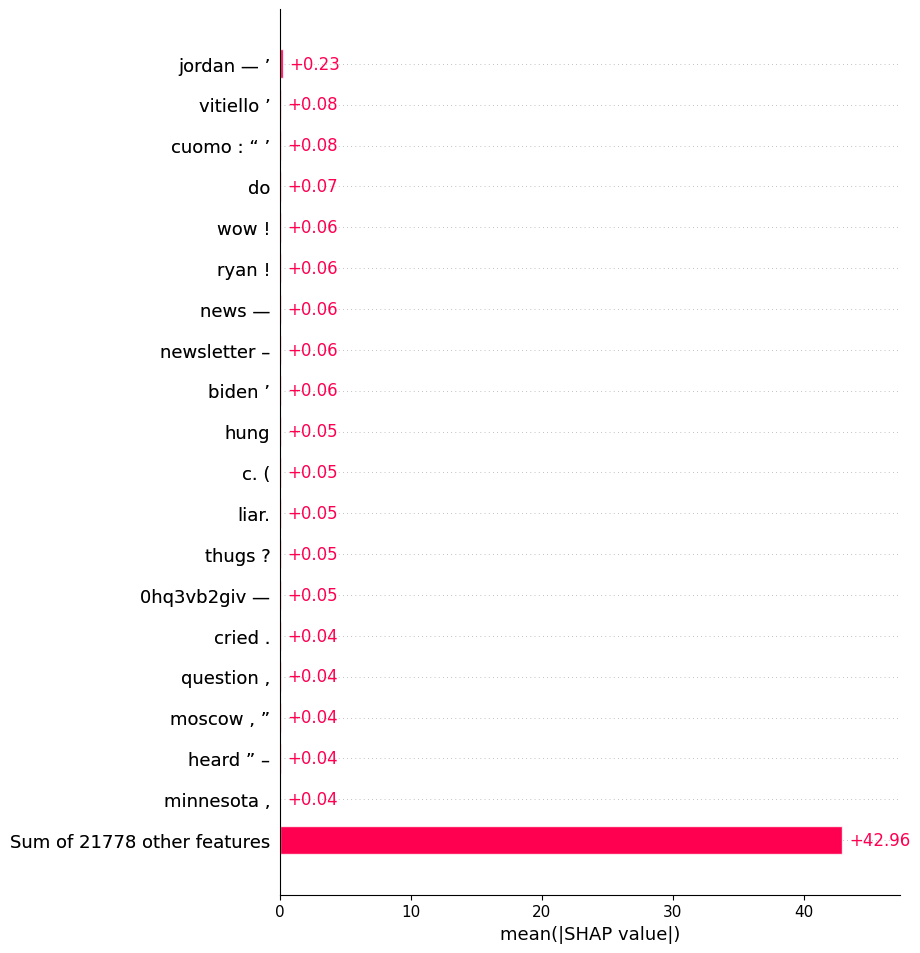

In [31]:
shap.plots.bar(shap_values, max_display=20)


/tmp/ipykernel_357392/958664709.py:25: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x['shap_value'].abs().mean()) \


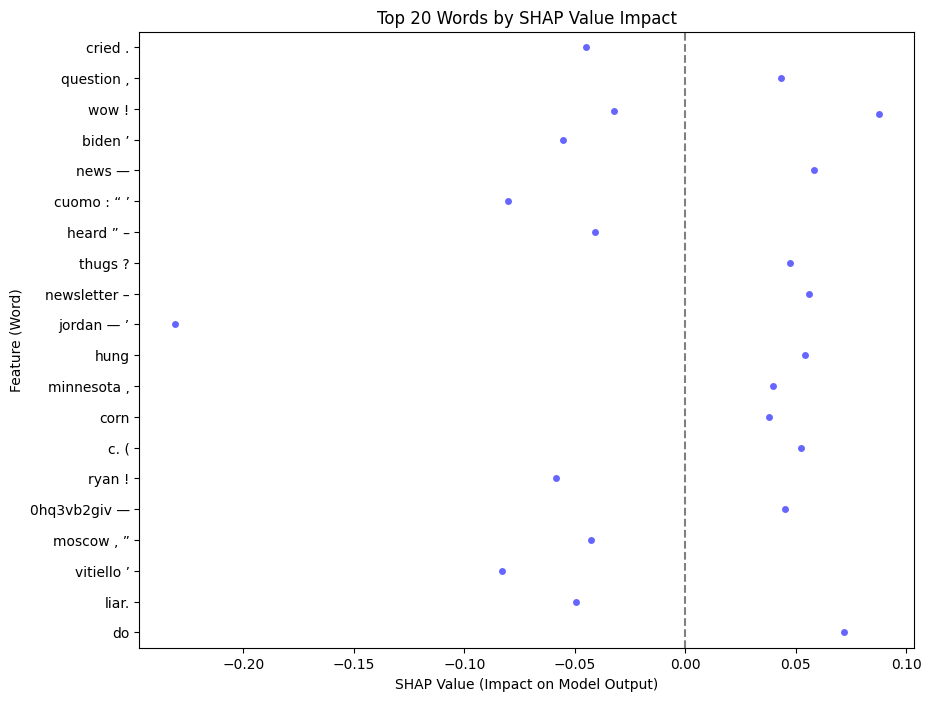

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. FLATTEN THE SHAP DATA
# We need to extract every (word, shap_value) pair from the complex SHAP object
shap_data = []
for i in range(len(shap_values)):
    # Get the words (data) and their impact (values) for sentence i
    words = shap_values[i].data
    values = shap_values[i].values

    for word, value in zip(words, values):
        # Clean up the word (remove whitespace)
        word_clean = word.strip()
        if word_clean: # Skip empty strings
            shap_data.append({'word': word_clean, 'shap_value': value})

# Create a DataFrame
df_shap = pd.DataFrame(shap_data)

# 2. FILTER TOP 20 WORDS
# Find words with highest average absolute impact
top_words = df_shap.groupby('word') \
    .apply(lambda x: x['shap_value'].abs().mean()) \
    .nlargest(20) \
    .index

# Filter our main data to only keep these top 20 words
df_top = df_shap[df_shap['word'].isin(top_words)]

# 3. PLOT (X=SHAP, Y=Feature)
plt.figure(figsize=(10, 8))
sns.stripplot(
    data=df_top,
    y='word',
    x='shap_value',
    jitter=0.2,    # Spreads dots out so they don't overlap too much
    alpha=0.6,     # Transparency
    color='blue'   # We can't use High/Low colors, so we use a solid color
)

plt.axvline(x=0, color='gray', linestyle='--') # Add a line at 0
plt.title('Top 20 Words by SHAP Value Impact')
plt.xlabel('SHAP Value (Impact on Model Output)')
plt.ylabel('Feature (Word)')
plt.show()


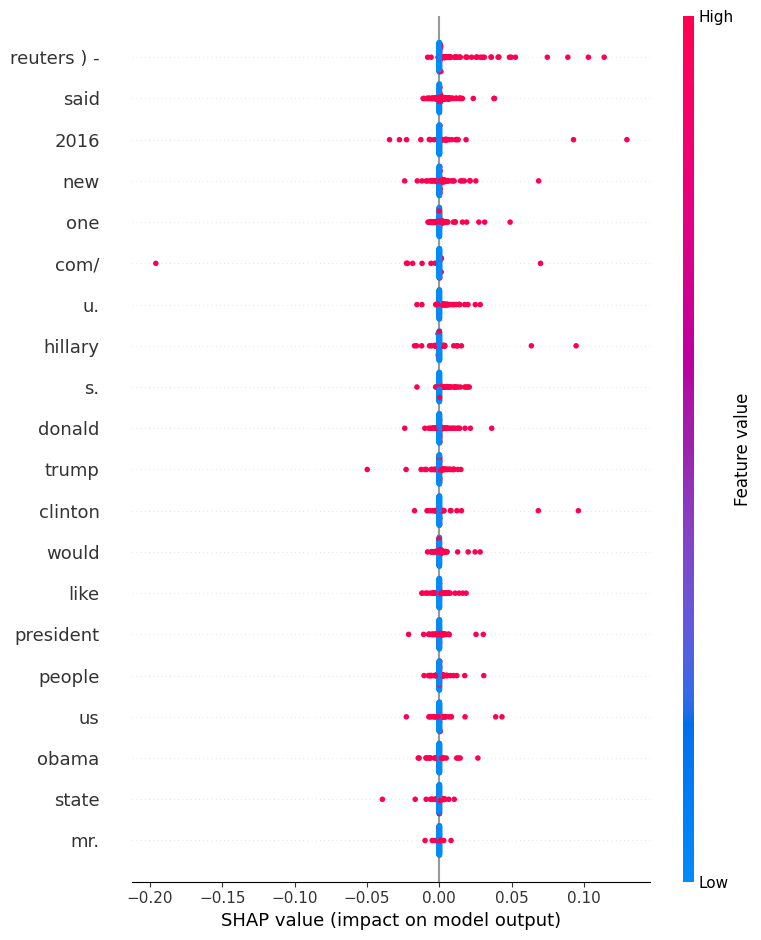

In [33]:
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt

# 1. FIND GLOBAL TOP WORDS
# Flatten all SHAP values to find which words are most important overall
all_words = []
all_values = []

for i in range(len(shap_values)):
    # .data is the word list, .values is the impact score
    all_words.extend([w.strip() for w in shap_values[i].data])
    all_values.extend(shap_values[i].values)

# Create a temporary dataframe to calculate total importance
df_vocab = pd.DataFrame({'word': all_words, 'shap': all_values})
# Group by word and sum the absolute SHAP values to find the "Top 20"
top_words = df_vocab.groupby('word')['shap'].apply(lambda x: x.abs().sum()).nlargest(20).index.tolist()

# 2. CREATE DENSE MATRICES FOR PLOTTING
# We need a matrix of shape (200 samples, 20 top words)
# One matrix for SHAP values, one for Feature Values (1=Present, 0=Absent)
N_SAMPLES = len(shap_values)
N_FEATURES = len(top_words)

dense_shap = np.zeros((N_SAMPLES, N_FEATURES))
dense_features = np.zeros((N_SAMPLES, N_FEATURES))

for i in range(N_SAMPLES):
    # Get words/values for this specific sentence
    sample_words = [w.strip() for w in shap_values[i].data]
    sample_values = shap_values[i].values

    # Map them to our dense matrix
    for j, word in enumerate(top_words):
        if word in sample_words:
            # Find the index of the word in this sentence
            # (Take the first occurrence if it appears multiple times)
            idx = sample_words.index(word)

            # Record the SHAP value
            dense_shap[i, j] = sample_values[idx]

            # Record Feature Value (1 = High/Present)
            dense_features[i, j] = 1
        else:
            # If word is missing: SHAP is 0, Feature Value is 0 (Low/Absent)
            dense_shap[i, j] = 0
            dense_features[i, j] = 0

# 3. GENERATE THE SUMMARY PLOT
shap.summary_plot(
    dense_shap,
    dense_features,
    feature_names=top_words,
    max_display=20,
    plot_type="dot"
)


# cnn + lstm

In [36]:
# from tensorflow import keras
# from tensorflow.keras import layers

# CONSISTENT IMPORTS
import tf_keras as keras
from tf_keras import layers # <--- CORRECT! Use the legacy layers


num_classes = 1  # Replace this with the actual number of classes in your dataset

# Define the custom embedding layer using the embedding_matrix
embedding_layer = layers.Embedding(
    max_words,
    100,
    weights=[embedding_matrix],  # Pass the embedding_matrix as the weights
    input_length=max_len,
    trainable=False  # Set trainable to False to keep the pre-trained embeddings fixed
)

model_4 = keras.Sequential([
    embedding_layer,
    layers.BatchNormalization(),
    layers.Conv1D(filters = 32, kernel_size = 3, activation = 'relu'),
    layers.MaxPooling1D(pool_size=2, strides=2, padding='valid'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Conv1D(filters = 32, kernel_size = 3, activation = 'relu'),
    layers.MaxPooling1D(pool_size = 2, strides = 2, padding = 'valid'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.LSTM(units = 64),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='sigmoid')

])


In [37]:
model_4.compile(
    optimizer = 'adam',
    loss = 'binary_crossentropy',
    metrics = ['binary_accuracy'],

)


In [38]:
early_stopping = keras.callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    restore_best_weights=True,
)

model_4.summary()

history = model_4.fit(training_padded, y_train, validation_data=(testing_padded, y_test),
                      batch_size=20, epochs=20, verbose=2,callbacks = [early_stopping], )


accr = model_4.evaluate(testing_padded, y_test, verbose=0)


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 1000, 100)         1000000   
                                                                 
 batch_normalization_1 (Bat  (None, 1000, 100)         400       
 chNormalization)                                                
                                                                 
 conv1d_2 (Conv1D)           (None, 998, 32)           9632      
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 499, 32)           0         
 g1D)                                                            
                                                                 
 dropout (Dropout)           (None, 499, 32)           0         
                                                                 
 batch_normalization_2 (Bat  (None, 499, 32)          

<Axes: title={'center': 'Accuracy'}>

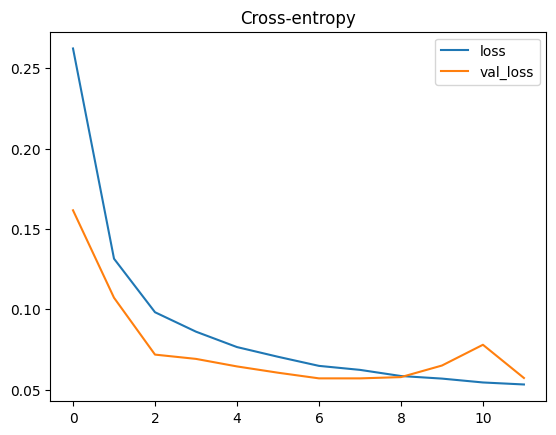

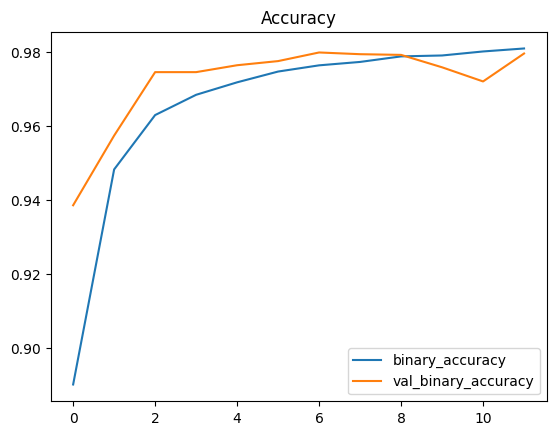

In [39]:
from matplotlib.pyplot import plot
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-entropy")
history_df.loc[:, ['binary_accuracy', 'val_binary_accuracy']].plot(title="Accuracy")


In [40]:
import numpy as np
import shap
from tensorflow.keras.preprocessing.sequence import pad_sequences

# 1. Initialize JS
shap.initjs()

# 2. Define the Wrapper (Renamed for Model 4)
def predict_shap_m4(texts):
    # Convert numpy array to list
    text_list = texts.tolist()

    # Tokenize (Using the same global tokenizer)
    sequences = tokenizer.texts_to_sequences(text_list)

    # Pad sequences
    padded_sequences = pad_sequences(
        sequences,
        maxlen=1000,      # Matching model input length
        padding='post',
        truncating='post'
    )

    # Predict using MODEL 4
    preds = model_4.predict(padded_sequences, verbose=0)

    if preds.shape[1] == 2:
        return preds[:, 1]
    else:
        return preds.reshape(-1)

# 3. Sample Data (Renamed variable)
sample_texts_m4 = X_test[:200]

# 4. Initialize Explainer (Renamed variable)
explainer_m4 = shap.Explainer(
    predict_shap_m4,
    masker=shap.maskers.Text()
)

# 5. Compute SHAP Values (Renamed variable)
shap_values_m4 = explainer_m4(sample_texts_m4)

# Visualize first prediction
shap.plots.text(shap_values_m4[0])


PartitionExplainer explainer: 201it [20:48,  6.28s/it]                         


Summary Plot for Model 4


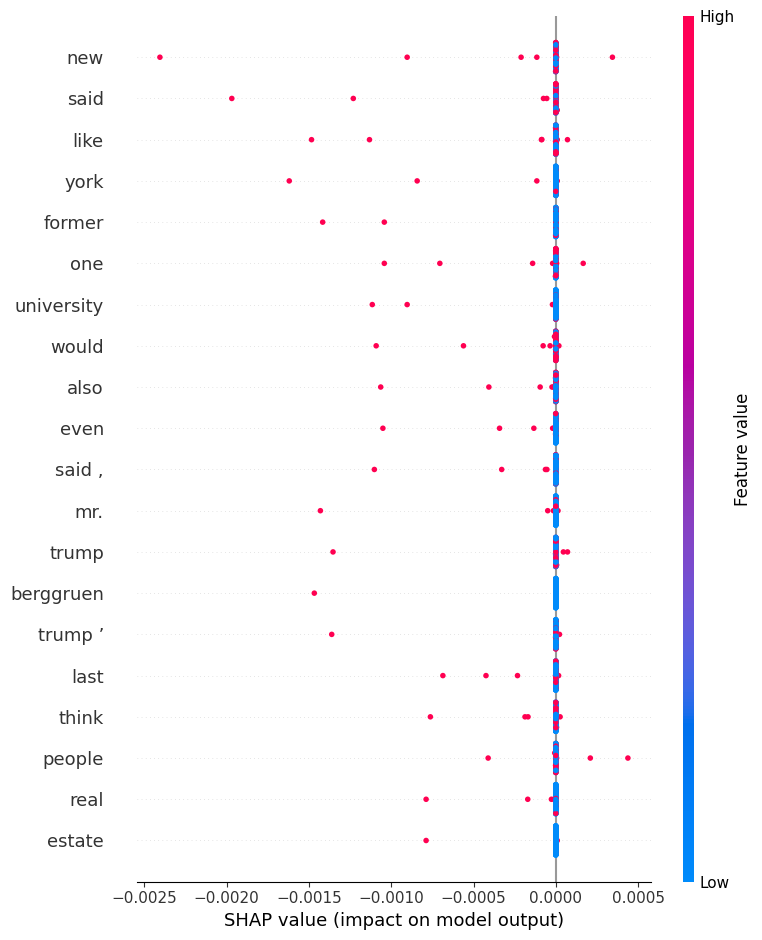

In [41]:
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt

# 1. FIND GLOBAL TOP WORDS FOR MODEL 4
all_words_m4 = []
all_values_m4 = []

for i in range(len(shap_values_m4)):
    # Extract data from the m4 shap values
    all_words_m4.extend([w.strip() for w in shap_values_m4[i].data])
    all_values_m4.extend(shap_values_m4[i].values)

# Calculate importance specifically for Model 4
df_vocab_m4 = pd.DataFrame({'word': all_words_m4, 'shap': all_values_m4})
top_words_m4 = df_vocab_m4.groupby('word')['shap'].apply(lambda x: x.abs().sum()).nlargest(20).index.tolist()

# 2. CREATE DENSE MATRICES (Independent variables)
N_SAMPLES = len(shap_values_m4)
N_FEATURES = len(top_words_m4)

dense_shap_m4 = np.zeros((N_SAMPLES, N_FEATURES))
dense_features_m4 = np.zeros((N_SAMPLES, N_FEATURES))

for i in range(N_SAMPLES):
    sample_words = [w.strip() for w in shap_values_m4[i].data]
    sample_values = shap_values_m4[i].values

    for j, word in enumerate(top_words_m4):
        if word in sample_words:
            idx = sample_words.index(word)
            dense_shap_m4[i, j] = sample_values[idx]
            dense_features_m4[i, j] = 1 # Present
        else:
            dense_shap_m4[i, j] = 0
            dense_features_m4[i, j] = 0 # Absent

# 3. GENERATE THE SUMMARY PLOT
print("Summary Plot for Model 4")
shap.summary_plot(
    dense_shap_m4,
    dense_features_m4,
    feature_names=top_words_m4,
    max_display=20,
    plot_type="dot"
)


In [ ]:
# # from tensorflow import keras
# # from tensorflow.keras import layers

# # CONSISTENT IMPORTS
# import tf_keras as keras
# from tf_keras import layers

# num_classes = 1  # Replace this with the actual number of classes in your dataset

# # Define the custom embedding layer using the embedding_matrix
# # Define the input layer
# input_layer = layers.Input(shape=(max_len,), dtype='int32')

# embedding_layer = layers.Embedding(
#     max_words,
#     100,
#     weights=[embedding_matrix],  # Pass the embedding_matrix as the weights
#     input_length=max_len,
#     trainable=False  # Set trainable to False to keep the pre-trained embeddings fixed
# )

# # Get the embedding output
# embedded_sequences = embedding_layer(input_layer)


# # First 1D-CNN block
# cnn1 = layers.Conv1D(128, kernel_size=3, activation='relu')(embedded_sequences)
# maxpool1 = layers.MaxPooling1D(pool_size=2)(cnn1)

# # Second 1D-CNN block
# cnn2 = layers.Conv1D(128, kernel_size=4, activation='relu')(embedded_sequences)
# maxpool2 = layers.MaxPooling1D(pool_size=2)(cnn2)

# # Third 1D-CNN block
# cnn3 = layers.Conv1D(128, kernel_size=5, activation='relu')(embedded_sequences)
# maxpool3 = layers.MaxPooling1D(pool_size=2)(cnn3)

# # Concatenate the outputs of the three 1D-CNN blocks
# concatenated_layers = layers.concatenate([maxpool1, maxpool2, maxpool3])

# # Max-pooling layer to further reduce vector dimension
# maxpool_combined = layers.MaxPooling1D(pool_size=5)(concatenated_layers)

# # Convolution layer after concatenation
# conv_combined = layers.Conv1D(128, kernel_size=5, activation='relu')(maxpool_combined)

# # Two hidden layers
# hidden1 = layers.Dense(384, activation='relu')(conv_combined)
# hidden2 = layers.Dense(128, activation='relu')(hidden1)

# # Output layer
# output_layer = layers.Dense(num_classes, activation='sigmoid')(hidden2)



In [ ]:
# from sklearn.ensemble import AdaBoostClassifier
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.metrics import accuracy_score, classification_report

# # 1. Initialize the base estimator
# base_estimator = DecisionTreeClassifier(max_depth=3)

# # 2. Use 'estimator' instead of 'base_estimator'
# model_ad = AdaBoostClassifier(
#     estimator=base_estimator,  # <--- CHANGED HERE
#     n_estimators=50,
#     random_state=42
# )

# model_ad.fit(X_train, y_train)
# y_pred = model_ad.predict(X_test)

# print(accuracy_score(y_test, y_pred))
# print(classification_report(y_test, y_pred))


In [ ]:
# # Create the model
# model = models.Model(inputs=input_layer, outputs=output_layer)

# # Compile the model with appropriate optimizer and loss function
# model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# # Print the model summary
# model.summary()


# using PCA (Principal component analysis)

In [42]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Assuming 'data' is your input data (replace it with your actual data)
# Apply standardization to scale the features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(embedding_matrix)


# After creating the embedding_matrix, apply PCA to reduce the dimensionality
pca = PCA(n_components=0.95)  # Set the number of components you want to keep (e.g., 50)
embedding_matrix_pca = pca.fit_transform(scaled_data)

#get the actual number of components after pca
num_components = pca.n_components_
print(num_components)




82


In [43]:
# from tensorflow import keras
# from tensorflow.keras import layers

# CONSISTENT IMPORTS
import tf_keras as keras
from tf_keras import layers

num_classes = 1  # Replace this with the actual number of classes in your dataset

# Replace the original embedding_matrix with the PCA-transformed embedding_matrix
embedding_layer = layers.Embedding(
    input_dim = max_words,
    output_dim = num_components,  # Update the number of dimensions to the number of components chosen in PCA
    weights=[embedding_matrix_pca],  # Pass the PCA-transformed embedding_matrix
    input_length=max_len,
    trainable=False
)

model_5 = keras.Sequential([
    embedding_layer,
    layers.BatchNormalization(),
    layers.Conv1D(filters = 32, kernel_size = 3, activation = 'relu'),
    layers.MaxPooling1D(pool_size=2, strides=2, padding='valid'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Conv1D(filters = 32, kernel_size = 3, activation = 'relu'),
    layers.MaxPooling1D(pool_size = 2, strides = 2, padding = 'valid'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.LSTM(units = 64),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='sigmoid')

])


In [44]:
model_5.compile(
    optimizer = 'adam',
    loss = 'binary_crossentropy',
    metrics = ['binary_accuracy'],

)

model_5.summary()

history = model_5.fit(training_padded, y_train, validation_data=(testing_padded, y_test),
                      batch_size=20, epochs=20, verbose=2 )


accr = model_5.evaluate(testing_padded, y_test, verbose=0)


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 1000, 82)          820000    
                                                                 
 batch_normalization_4 (Bat  (None, 1000, 82)          328       
 chNormalization)                                                
                                                                 
 conv1d_4 (Conv1D)           (None, 998, 32)           7904      
                                                                 
 max_pooling1d_3 (MaxPoolin  (None, 499, 32)           0         
 g1D)                                                            
                                                                 
 dropout_2 (Dropout)         (None, 499, 32)           0         
                                                                 
 batch_normalization_5 (Bat  (None, 499, 32)          

<Axes: title={'center': 'Accuracy'}>

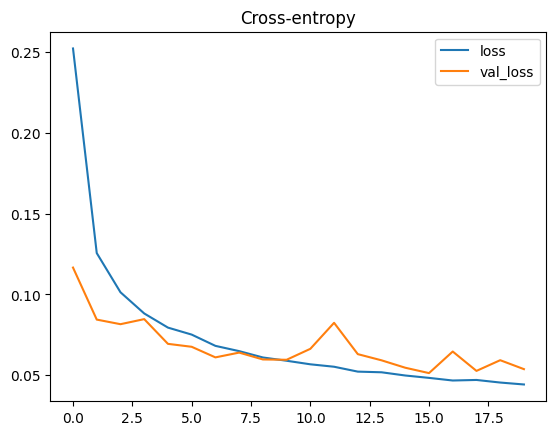

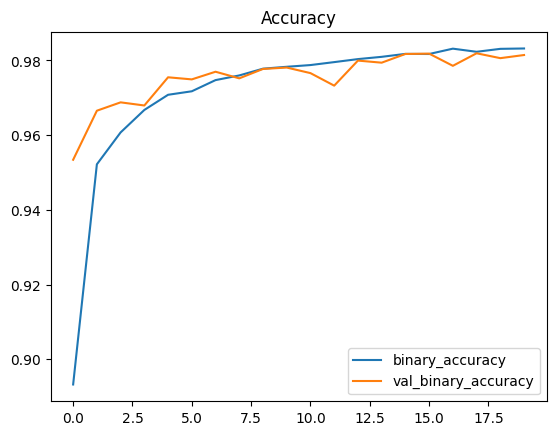

In [45]:
from matplotlib.pyplot import plot
history_df = pd.DataFrame(history.history)
history_df.loc[0:, ['loss', 'val_loss']].plot(title="Cross-entropy")
history_df.loc[0:, ['binary_accuracy', 'val_binary_accuracy']].plot(title="Accuracy")


In [46]:
import numpy as np
import shap
from tensorflow.keras.preprocessing.sequence import pad_sequences

# 1. Initialize JS
shap.initjs()

# 2. Define the Wrapper (Renamed for Model 5)
def predict_shap_m5(texts):
    # Convert numpy array to list
    text_list = texts.tolist()

    # Tokenize (Using the same global tokenizer)
    sequences = tokenizer.texts_to_sequences(text_list)

    # Pad sequences
    padded_sequences = pad_sequences(
        sequences,
        maxlen=1000,      # Matching model input length
        padding='post',
        truncating='post'
    )

    # Predict using MODEL 5
    preds = model_5.predict(padded_sequences, verbose=0)

    if preds.shape[1] == 2:
        return preds[:, 1]
    else:
        return preds.reshape(-1)

# 3. Sample Data
sample_texts_m5 = X_test[:200]

# 4. Initialize Explainer
explainer_m5 = shap.Explainer(
    predict_shap_m5,
    masker=shap.maskers.Text()
)

# 5. Compute SHAP Values
shap_values_m5 = explainer_m5(sample_texts_m5)

# Visualize one example to ensure it worked
shap.plots.text(shap_values_m5[0])


PartitionExplainer explainer: 201it [24:33,  7.41s/it]                         


Summary Plot for Model 5


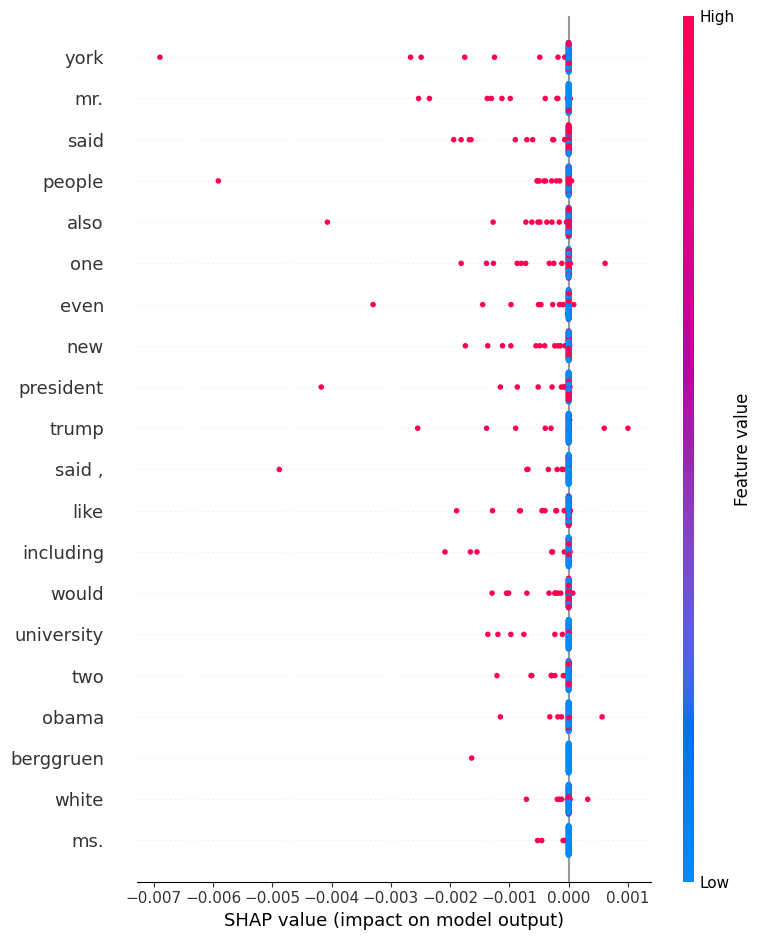

In [48]:
import numpy as np
import pandas as pd
import shap
import matplotlib.pyplot as plt

# 1. FIND GLOBAL TOP WORDS FOR MODEL 5
all_words_m5 = []
all_values_m5 = []

for i in range(len(shap_values_m5)):
    # Extract data from the m5 shap values
    all_words_m5.extend([w.strip() for w in shap_values_m5[i].data])
    all_values_m5.extend(shap_values_m5[i].values)

# Calculate importance specifically for Model 5
df_vocab_m5 = pd.DataFrame({'word': all_words_m5, 'shap': all_values_m5})
top_words_m5 = df_vocab_m5.groupby('word')['shap'].apply(lambda x: x.abs().sum()).nlargest(20).index.tolist()

# 2. CREATE DENSE MATRICES (Independent variables)
N_SAMPLES = len(shap_values_m5)
N_FEATURES = len(top_words_m5)

dense_shap_m5 = np.zeros((N_SAMPLES, N_FEATURES))
dense_features_m5 = np.zeros((N_SAMPLES, N_FEATURES))

for i in range(N_SAMPLES):
    sample_words = [w.strip() for w in shap_values_m5[i].data]
    sample_values = shap_values_m5[i].values

    for j, word in enumerate(top_words_m5):
        if word in sample_words:
            idx = sample_words.index(word)
            dense_shap_m5[i, j] = sample_values[idx]
            dense_features_m5[i, j] = 1 # Red: Word Present
        else:
            dense_shap_m5[i, j] = 0
            dense_features_m5[i, j] = 0 # Blue: Word Absent

# 3. GENERATE THE SUMMARY PLOT
print("Summary Plot for Model 5")
shap.summary_plot(
    dense_shap_m5,
    dense_features_m5,
    feature_names=top_words_m5,
    max_display=20,
    plot_type="dot"
)
